In [1]:
import os
import glob

import cv2 as cv

from hep2_classification.presentation import display_grid, ImagePlotter, HistogramPlotter, LayerPlotter
from hep2_classification.preprocessing import _reduce_channels, _resize, _denoise, _normalize

### Settings

In [2]:
paths = list(sorted(glob.glob('data/samples/*.*')))
titles = [os.path.splitext(os.path.basename(p))[0] for p in paths]
size = (800, 600)
denoise_h = 2

### Load data

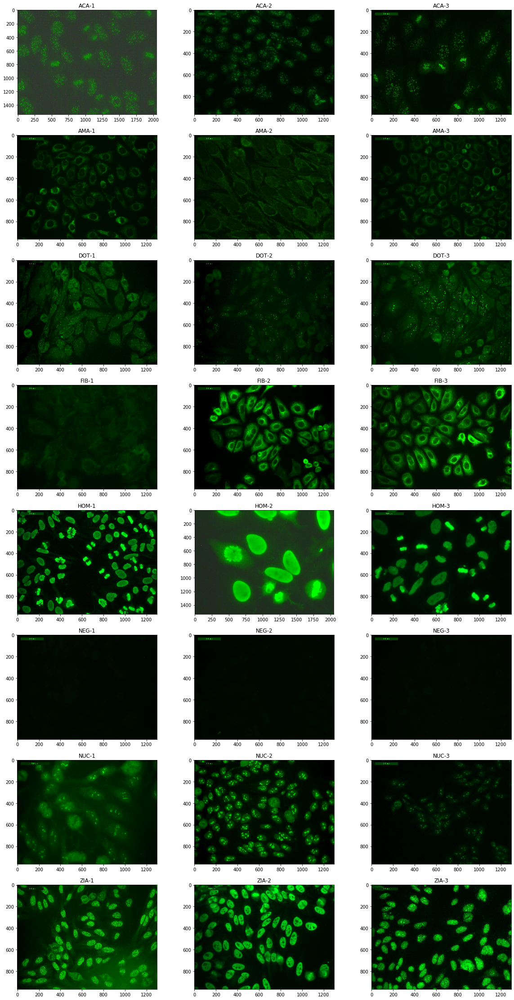

In [3]:
imgs = [cv.imread(p) for p in paths]
display_grid(imgs, ImagePlotter(), titles)

### Reduce channels

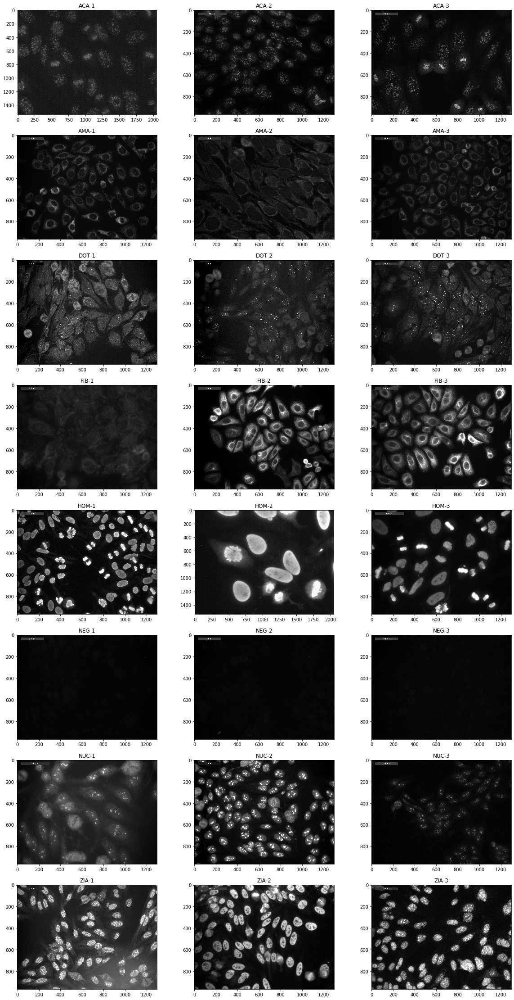

In [4]:
imgs_reduced = [_reduce_channels(img) for img in imgs]
display_grid(imgs_reduced, ImagePlotter(), titles)

### Resize

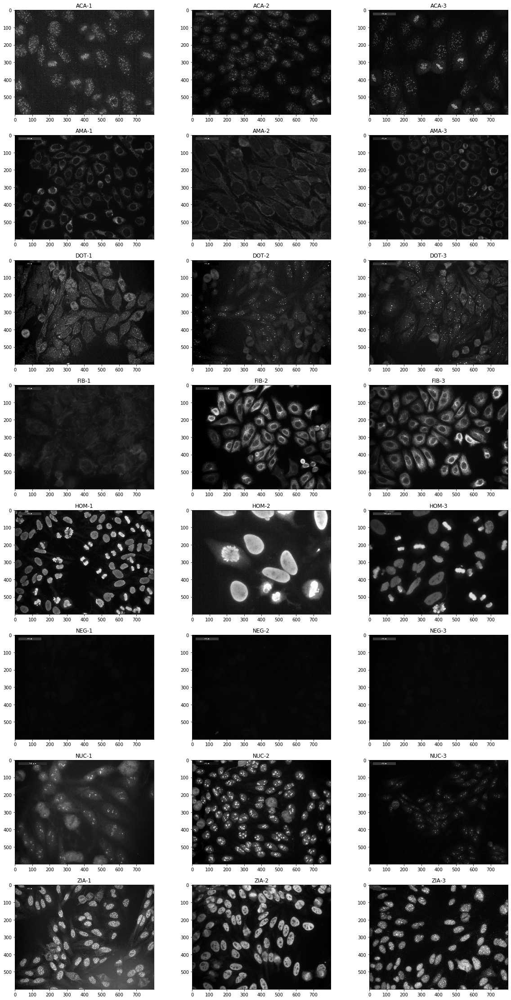

In [5]:
imgs_resized = [_resize(img, size=size) for img in imgs_reduced]
display_grid(imgs_resized, ImagePlotter(), titles)

### Denoise

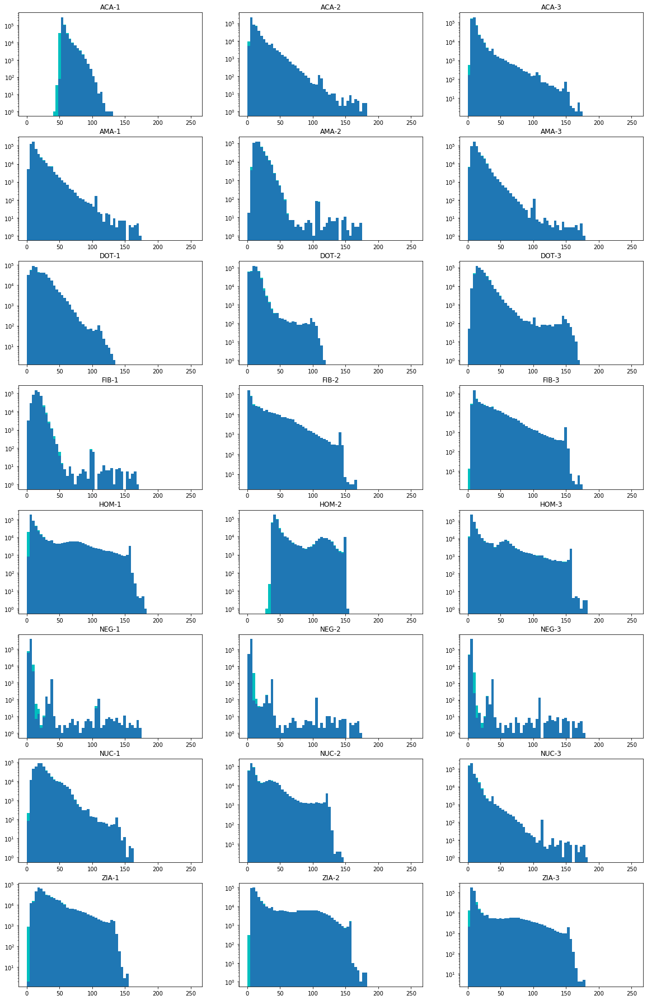

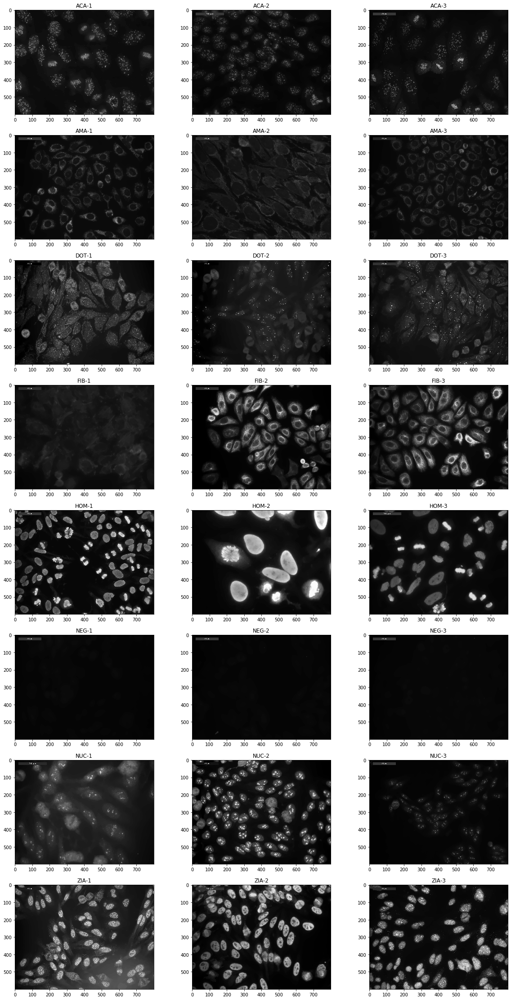

In [6]:
imgs_denoised = [_denoise(img, h=denoise_h) for img in imgs_resized]
display_grid(list(zip(imgs_resized, imgs_denoised)), LayerPlotter(HistogramPlotter(color='c'), HistogramPlotter()), titles)
display_grid(imgs_denoised, ImagePlotter(), titles)

### Normalize

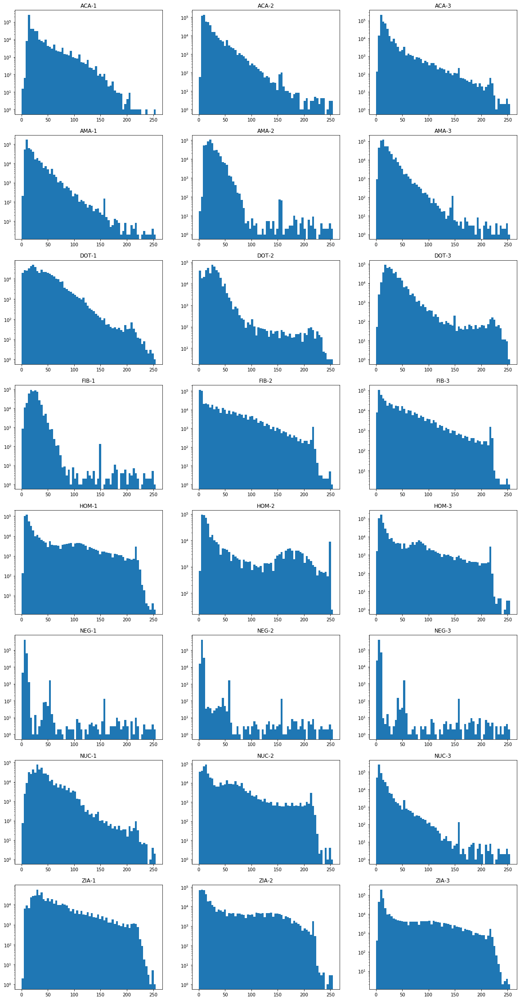

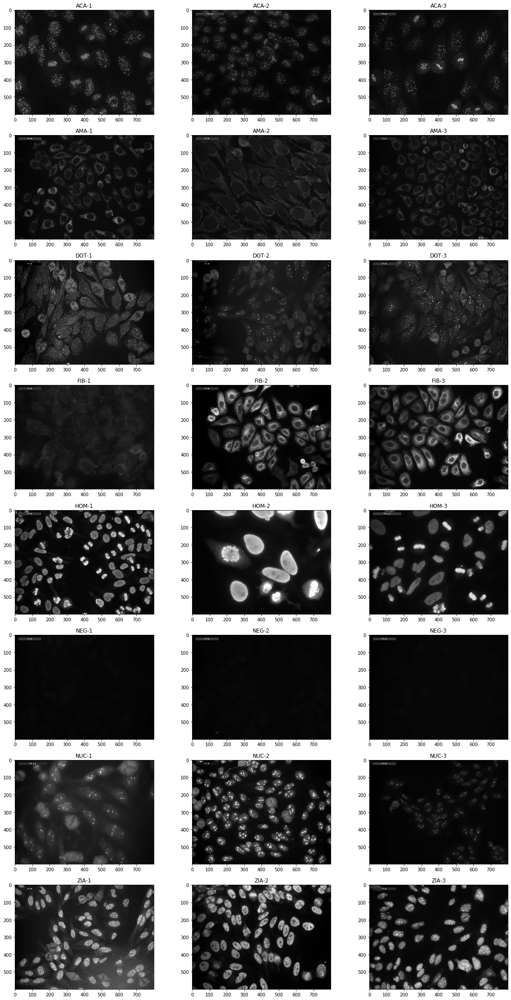

In [7]:
imgs_normalized = [_normalize(img) for img in imgs_denoised]
display_grid(imgs_normalized, HistogramPlotter(), titles)
display_grid(imgs_normalized, ImagePlotter(), titles)